# PlantCLEF 2026 — Exploratory Data Analysis

Goal: turn the team-best **0.38333** (010 BioCLIP-2.5 last_blocks, grid_4x4 + softmax_mean + top-3) into a clear-eyed view of *what's left on the table*.

Five questions, each in its own section:

1. **Test-set composition** — what do the 2,105 quadrats actually look like (resolution, aspect, color stats)?
2. **LUCAS pseudo-quadrats vs test** — is the 212K-image LUCAS set a usable in-domain pool?
3. **Train-set class balance** — long-tail severity, train↔test species coverage.
4. **Effective-K per test quadrat** — implied number of distinct species per quadrat from 010's `probs_mean` (entropy / threshold proxies).
5. **Tile-level diagnostics** — how does grid_4x4 chop the test images, and where does the model concentrate confidence?

**Reproducibility.** All paths are absolute Linux paths on the runpod (`213.173.105.150:30979`). The notebook is run on that pod via `jupyter nbconvert --to notebook --execute`. The 010 npz is the same one that produced the **0.37431** resubmit (regenerated bf16 ≠ historical 0.38333; the gap is bf16 non-determinism, not a recipe change).

In [1]:
import os
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

try:
    import seaborn as sns
    sns.set_theme(style='whitegrid', context='talk', palette='deep')
except ImportError:
    pass

%matplotlib inline

RNG = np.random.default_rng(42)
random.seed(42)

TEST_DIR     = Path('/workspace/plantclef/processed/test_images_jpeg85_max800')
LUCAS_ROOT   = Path('/workspace/plantclef/raw/pseudo_quadrats')
TRAIN_META   = Path('/workspace/plantclef/processed/train_metadata_cleaned_verified_stratified.csv')
TEST_SPECIES = Path('/workspace/plantclef/raw/test/data/PlantCLEF2026/species_ids.csv')
SPECIES_MAP  = Path('/workspace/plantclef/processed/species_ids_mapping.csv')
NPZ_010      = Path('/workspace/working/workspace/PlantCLEF2026/src_experiments/010_bioclip25_end_to_end_finetune_multitask/outputs/test_probs_010_last_blocks_grid4x4.npz')
TRAIN_IMG    = Path('/workspace/plantclef/raw/train/images_max_side_800')

for p, name in [(TEST_DIR,'TEST_DIR'), (LUCAS_ROOT,'LUCAS_ROOT'), (TRAIN_META,'TRAIN_META'),
                (TEST_SPECIES,'TEST_SPECIES'), (NPZ_010,'NPZ_010')]:
    print(f'  {name:14s} {"OK" if p.exists() else "MISSING":7s}  {p}')

  TEST_DIR       OK       /workspace/plantclef/processed/test_images_jpeg85_max800
  LUCAS_ROOT     OK       /workspace/plantclef/raw/pseudo_quadrats
  TRAIN_META     OK       /workspace/plantclef/processed/train_metadata_cleaned_verified_stratified.csv
  TEST_SPECIES   OK       /workspace/plantclef/raw/test/data/PlantCLEF2026/species_ids.csv
  NPZ_010        OK       /workspace/working/workspace/PlantCLEF2026/src_experiments/010_bioclip25_end_to_end_finetune_multitask/outputs/test_probs_010_last_blocks_grid4x4.npz


## 1. Test-set composition

Walk all 2,105 test JPEGs, collect cheap PIL stats (W, H, mean RGB, file size). No model inference yet.

In [2]:
def image_stats(path: Path) -> dict:
    with Image.open(path) as im:
        im.load()
        w, h = im.size
        arr = np.asarray(im.convert('RGB'), dtype=np.float32)
    return {
        'name': path.name,
        'w': w, 'h': h,
        'aspect': w / h,
        'megapixels': w * h / 1e6,
        'fsize_kb': path.stat().st_size / 1024,
        'mean_r': arr[..., 0].mean(),
        'mean_g': arr[..., 1].mean(),
        'mean_b': arr[..., 2].mean(),
        'std_l':  arr.mean(axis=-1).std(),
    }

test_paths = sorted(TEST_DIR.glob('*.jpg'))
print(f'Found {len(test_paths)} test quadrats')
test_df = pd.DataFrame([image_stats(p) for p in test_paths])
test_df.head()

Found 2105 test quadrats


,name,w,h,aspect,megapixels,fsize_kb,mean_r,mean_g,mean_b,std_l
0,2024-CEV3-20240602.jpg,800,737,1.085482,0.5896,315.277344,118.018250,135.838821,68.347466,62.704529
1,CBN-PdlC-A1-20130807.jpg,799,800,0.998750,0.6392,247.051758,82.425385,82.220390,67.516678,53.144142
2,CBN-PdlC-A1-20130903.jpg,719,800,0.898750,0.5752,251.326172,112.545174,112.889595,90.638718,65.084320
3,CBN-PdlC-A1-20140721.jpg,747,800,0.933750,0.5976,244.362305,114.002892,108.652283,81.536316,46.954296
4,CBN-PdlC-A1-20140811.jpg,778,800,0.972500,0.6224,278.713867,88.564522,90.433685,62.480526,52.481258


In [3]:
test_df.describe()[['w','h','aspect','megapixels','fsize_kb','mean_r','mean_g','mean_b']].round(2)

,w,h,aspect,megapixels,fsize_kb,mean_r,mean_g,mean_b
count,2105.00,2105.00,2105.00,2105.00,2105.00,2105.00,2105.00,2105.00
mean,776.45,776.53,1.00,0.60,253.13,116.51,117.39,90.75
std,42.71,44.82,0.10,0.04,36.46,13.86,12.54,16.45
min,544.00,545.00,0.68,0.44,113.49,66.11,67.97,43.11
25%,771.00,771.00,0.96,0.58,229.68,108.00,110.34,79.65
50%,800.00,800.00,1.00,0.62,254.61,116.62,118.68,90.09
75%,800.00,800.00,1.04,0.64,276.20,125.32,125.73,100.58
max,800.00,800.00,1.47,0.64,347.96,164.69,164.56,148.83


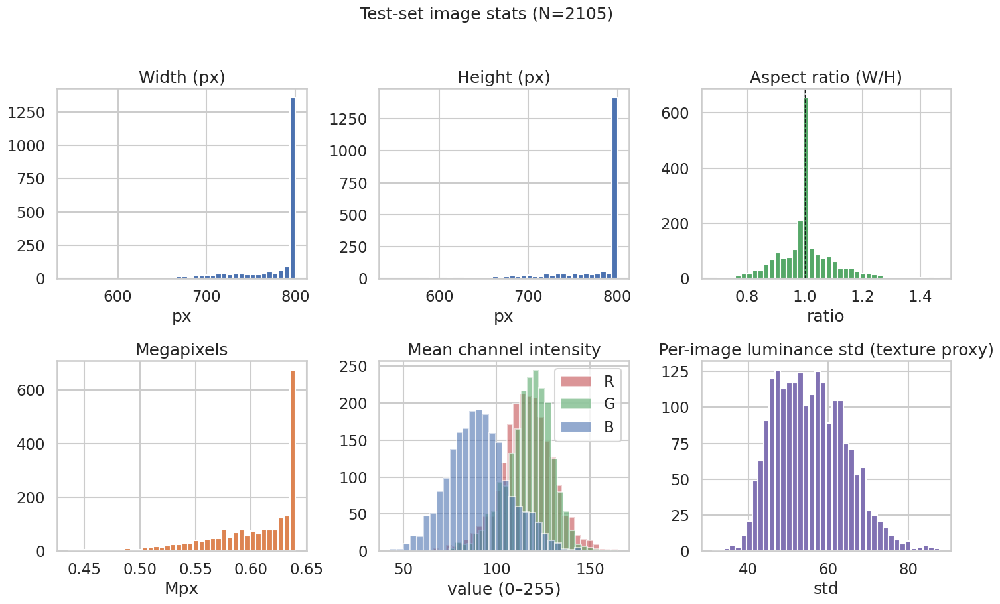

In [4]:
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes[0,0].hist(test_df['w'], bins=40, color='C0')
axes[0,0].set(title='Width (px)', xlabel='px')
axes[0,1].hist(test_df['h'], bins=40, color='C0')
axes[0,1].set(title='Height (px)', xlabel='px')
axes[0,2].hist(test_df['aspect'], bins=40, color='C2')
axes[0,2].axvline(1.0, color='k', lw=1, ls='--')
axes[0,2].set(title='Aspect ratio (W/H)', xlabel='ratio')
axes[1,0].hist(test_df['megapixels'], bins=40, color='C1')
axes[1,0].set(title='Megapixels', xlabel='Mpx')
axes[1,1].hist(test_df['mean_r'], bins=30, alpha=0.6, color='r', label='R')
axes[1,1].hist(test_df['mean_g'], bins=30, alpha=0.6, color='g', label='G')
axes[1,1].hist(test_df['mean_b'], bins=30, alpha=0.6, color='b', label='B')
axes[1,1].legend(); axes[1,1].set(title='Mean channel intensity', xlabel='value (0–255)')
axes[1,2].hist(test_df['std_l'], bins=40, color='C4')
axes[1,2].set(title='Per-image luminance std (texture proxy)', xlabel='std')
fig.suptitle('Test-set image stats (N=2105)', fontsize=18, y=1.02)
plt.tight_layout()
plt.show()

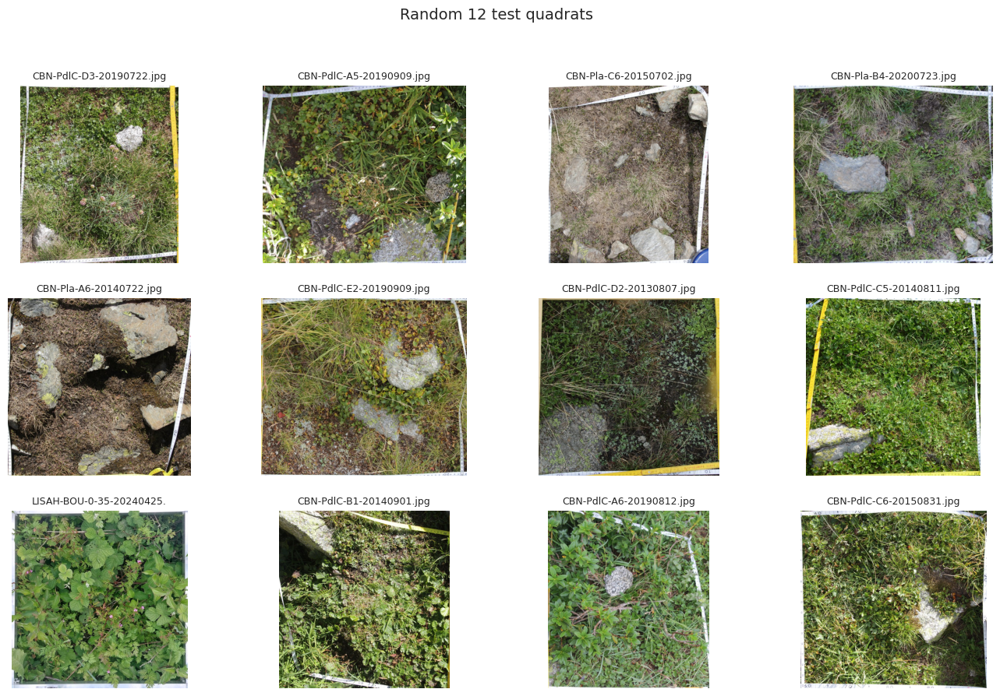

In [5]:
def show_mosaic(paths, title, cols=4, rows=3, fig_w=14):
    n = cols * rows
    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_w * rows / cols * 0.85))
    for ax, p in zip(axes.flat, paths[:n]):
        ax.imshow(np.asarray(Image.open(p).convert('RGB')))
        ax.set_title(p.name[:24], fontsize=9)
        ax.axis('off')
    for ax in axes.flat[len(paths):]:
        ax.axis('off')
    fig.suptitle(title, fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

show_mosaic(random.sample(test_paths, 12), 'Random 12 test quadrats')

## 2. LUCAS pseudo-quadrats vs test

LUCAS is the team's only large in-domain unlabeled pool. Sample evenly across 5 years × ~28 countries to keep it fast. The question: do LUCAS quadrats *visually match* the test distribution? If yes → SSL/pseudo-label paths are plausible; if no → we already burned this in 008 PhaseB.

The 008 v3 pseudo-label experiment scored 0.227 (memory: kaggle_baselines), so the quick verdict is already in. This section quantifies *why*.

In [6]:
LUCAS_TARGET = 200
lucas_years = sorted([d for d in LUCAS_ROOT.iterdir() if d.is_dir() and d.name.startswith('LUCAS')])
lucas_paths = []
per_year_target = LUCAS_TARGET // len(lucas_years)
for ydir in lucas_years:
    countries = [c for c in ydir.iterdir() if c.is_dir()]
    if not countries:
        continue
    per_country = max(1, per_year_target // len(countries))
    for cdir in countries:
        # quadrats live nested 2 more levels: X / Y / *.jpg
        leaves = [d for d in cdir.rglob('*.jpg')][:50]  # cap per country dir for speed
        random.shuffle(leaves)
        lucas_paths.extend(leaves[:per_country])

random.shuffle(lucas_paths)
lucas_paths = lucas_paths[:LUCAS_TARGET]
print(f'Sampled {len(lucas_paths)} LUCAS images across {len(lucas_years)} years')
lucas_df = pd.DataFrame([image_stats(p) for p in lucas_paths])
lucas_df.describe()[['w','h','aspect','megapixels','mean_r','mean_g','mean_b']].round(2)

Sampled 139 LUCAS images across 5 years


,w,h,aspect,megapixels,mean_r,mean_g,mean_b
count,139.00,139.00,139.00,139.00,139.00,139.00,139.00
mean,1740.29,1299.12,1.34,2.33,121.50,135.80,88.03
std,307.70,231.62,0.05,0.96,22.03,19.67,28.23
min,1024.00,768.00,1.33,0.79,61.14,95.94,32.29
25%,1600.00,1200.00,1.33,1.92,106.58,121.85,67.65
50%,1600.00,1200.00,1.33,1.92,120.78,134.71,87.42
75%,1792.00,1306.00,1.33,2.30,133.34,148.50,106.66
max,3264.00,2448.00,1.78,7.99,207.70,207.46,201.88


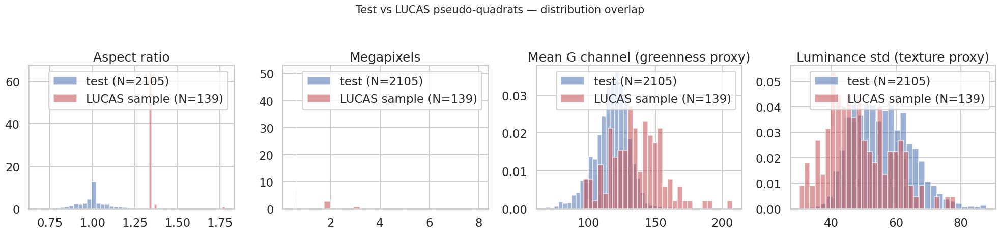

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(20, 4.5))
for ax, col, title in [
    (axes[0], 'aspect',     'Aspect ratio'),
    (axes[1], 'megapixels', 'Megapixels'),
    (axes[2], 'mean_g',     'Mean G channel (greenness proxy)'),
    (axes[3], 'std_l',      'Luminance std (texture proxy)'),
]:
    ax.hist(test_df[col],  bins=30, alpha=0.55, density=True, color='C0', label='test (N=2105)')
    ax.hist(lucas_df[col], bins=30, alpha=0.55, density=True, color='C3', label=f'LUCAS sample (N={len(lucas_df)})')
    ax.set_title(title); ax.legend()
fig.suptitle('Test vs LUCAS pseudo-quadrats — distribution overlap', fontsize=15, y=1.04)
plt.tight_layout()
plt.show()

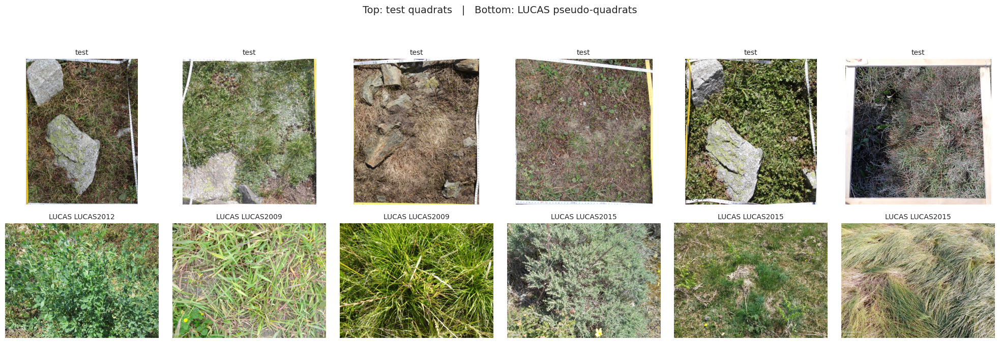

In [8]:
# Side-by-side mosaic
fig, axes = plt.subplots(2, 6, figsize=(20, 7))
test_pick  = random.sample(test_paths, 6)
lucas_pick = random.sample(lucas_paths, 6)
for ax, p in zip(axes[0], test_pick):
    ax.imshow(np.asarray(Image.open(p).convert('RGB'))); ax.axis('off'); ax.set_title('test', fontsize=10)
for ax, p in zip(axes[1], lucas_pick):
    ax.imshow(np.asarray(Image.open(p).convert('RGB'))); ax.axis('off'); ax.set_title(f'LUCAS {p.parent.parent.parent.parent.name}', fontsize=10)
fig.suptitle('Top: test quadrats   |   Bottom: LUCAS pseudo-quadrats', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## 3. Train-set class balance & coverage

1.4M images, 7,806 species after `train_metadata_cleaned_verified_stratified.csv` capping. We want:

- Distribution of images-per-species (long-tail severity)
- Whether the test species universe (`species_ids.csv`) is a subset of train

In [9]:
train_meta = pd.read_csv(TRAIN_META, sep=';')
print(f'rows: {len(train_meta):,}   columns: {list(train_meta.columns)}')
train_meta.head()

rows: 1,381,784   columns: ['image_name', 'species_id']


,image_name,species_id
0,666be7b275e1646679753fc88ef1712fbeff9561.jpg,1355868
1,00f5a6720aaeeaeb29818b5442b80a7714041df8.jpg,1355868
2,66d76dacc55d2ff416e2b7c4471c953b83b58bcd.jpg,1355868
3,8d692e98995122d295481e7faee0bf39d3279246.jpg,1355868
4,7e0266b8d11b29b0eedf23f582db04884d465c1a.jpg,1355868


In [10]:
counts = train_meta['species_id'].value_counts()
print(f'unique species in train: {len(counts):,}')
print(f'images per species — min: {counts.min()}  median: {counts.median():.0f}  mean: {counts.mean():.1f}  max: {counts.max()}')
print(f'   below 50: {(counts <  50).sum():,}   below 20: {(counts <  20).sum():,}   below 10: {(counts < 10).sum():,}   below 5: {(counts < 5).sum():,}')

unique species in train: 7,804
images per species — min: 1  median: 173  mean: 177.1  max: 500
   below 50: 2,384   below 20: 1,586   below 10: 1,075   below 5: 622


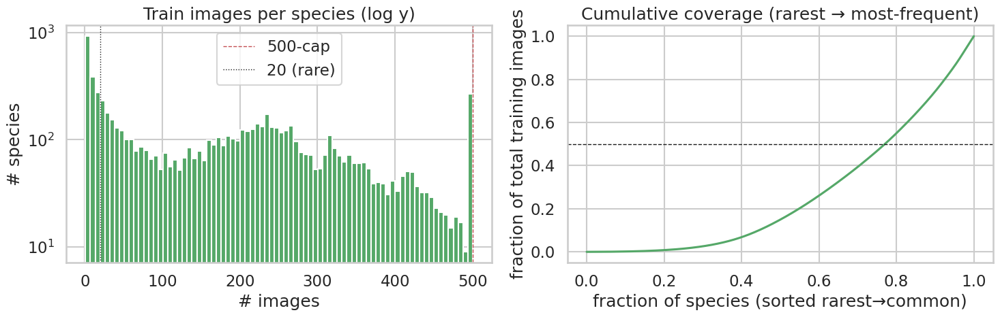

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
axes[0].hist(counts.values, bins=80, color='C2', log=True)
axes[0].axvline(500, color='r', ls='--', lw=1, label='500-cap')
axes[0].axvline(20,  color='k', ls=':',  lw=1, label='20 (rare)')
axes[0].set(title='Train images per species (log y)', xlabel='# images', ylabel='# species')
axes[0].legend()
axes[1].plot(np.arange(len(counts)) / len(counts), counts.values[::-1].cumsum() / counts.sum(), color='C2')
axes[1].set(title='Cumulative coverage (rarest → most-frequent)',
            xlabel='fraction of species (sorted rarest→common)',
            ylabel='fraction of total training images')
axes[1].axhline(0.5, color='k', ls='--', lw=1)
plt.tight_layout()
plt.show()

In [12]:
test_species = pd.read_csv(TEST_SPECIES)
test_sids = set(int(x) for x in test_species['species_id'].values)
train_sids = set(int(x) for x in counts.index)
print(f'test species universe:  {len(test_sids):,}')
print(f'train species universe: {len(train_sids):,}')
print(f'intersection:           {len(test_sids & train_sids):,}')
print(f'test \\ train:           {len(test_sids - train_sids):,}  ← unreachable from train')
print(f'train \\ test:           {len(train_sids - test_sids):,}  ← noise classes (training-only)')

test species universe:  7,806
train species universe: 7,804
intersection:           7,804
test \ train:           2  ← unreachable from train
train \ test:           0  ← noise classes (training-only)


Train images for the test-species subset:
   N: 7,804   below 50: 2,384   below 20: 1,586   below 10: 1,075


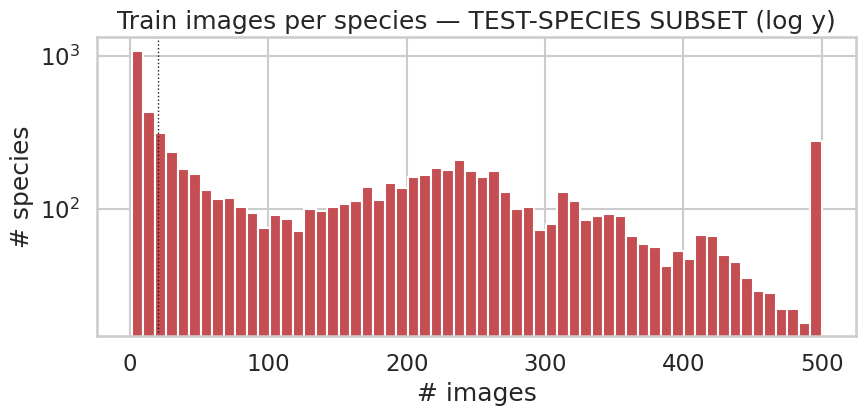

In [13]:
# Drill into rare-but-in-test species — these are where macro-F1 dies
intersection = test_sids & train_sids
test_counts = counts.loc[counts.index.astype(int).isin(intersection)] if counts.index.dtype == object else counts.loc[counts.index.isin(intersection)]
test_counts = counts.loc[[s for s in counts.index if int(s) in intersection]]
print('Train images for the test-species subset:')
print(f'   N: {len(test_counts):,}   below 50: {(test_counts <  50).sum():,}   below 20: {(test_counts <  20).sum():,}   below 10: {(test_counts < 10).sum():,}')
fig, ax = plt.subplots(figsize=(9, 4.5))
ax.hist(test_counts.values, bins=60, color='C3', log=True)
ax.set(title='Train images per species — TEST-SPECIES SUBSET (log y)', xlabel='# images', ylabel='# species')
ax.axvline(20, color='k', ls=':', lw=1)
plt.tight_layout()
plt.show()

## 4. Effective species count per test quadrat

The challenge metric is macro-F1 on multi-label predictions (true K is unknown per-quadrat). We submit a *fixed* top-3, so any quadrat with `K_true ≠ 3` loses F1.

Use the 010 npz `probs_mean` (= softmax_mean across 16 grid_4x4 tiles) as a proxy:

- **entropy** — H = −Σ p log p; high H ≈ many plausible species (or noisy quadrat).
- **count above threshold** — n_τ = |{i : p_i > τ}| at τ ∈ {1/7806 × 5, 0.01, 0.05}.
- **top-K cumulative mass** — how much probability lives in the top-3 vs top-5 vs top-10.

In [14]:
npz = np.load(NPZ_010, allow_pickle=True)
probs = npz['probs_mean'].astype(np.float32)
probs_max = npz['probs_max'].astype(np.float32)
qids   = npz['quadrat_ids']
sids   = npz['species_ids']
print(f'probs_mean shape: {probs.shape}   dtype: {probs.dtype}')
print(f'sum-per-row     : min {probs.sum(1).min():.3f}  median {np.median(probs.sum(1)):.3f}  max {probs.sum(1).max():.3f}  (close to 1.0 ⇒ true softmax)')

probs_mean shape: (2105, 7806)   dtype: float32
sum-per-row     : min 1.000  median 1.000  max 1.000  (close to 1.0 ⇒ true softmax)


In [15]:
EPS = 1e-9
log_probs = np.log(probs + EPS)
entropy = -(probs * log_probs).sum(axis=1)              # nats
max_entropy = np.log(probs.shape[1])                    # log(7806)
entropy_norm = entropy / max_entropy                    # 0..1

topk_idx = np.argsort(-probs, axis=1, kind='stable')
p_top1 = probs[np.arange(len(probs)), topk_idx[:, 0]]
p_top3 = np.take_along_axis(probs, topk_idx[:, :3], axis=1).sum(axis=1)
p_top5 = np.take_along_axis(probs, topk_idx[:, :5], axis=1).sum(axis=1)

thr_a, thr_b, thr_c = 5.0/probs.shape[1], 0.01, 0.05    # ~0.0006, 0.01, 0.05
n_thr_a = (probs > thr_a).sum(axis=1)
n_thr_b = (probs > thr_b).sum(axis=1)
n_thr_c = (probs > thr_c).sum(axis=1)

summary = pd.DataFrame({
    'entropy_norm': entropy_norm,
    'p_top1': p_top1, 'p_top3': p_top3, 'p_top5': p_top5,
    f'n>thr={thr_a:.4f}': n_thr_a,
    f'n>thr=0.01': n_thr_b,
    f'n>thr=0.05': n_thr_c,
})
summary.describe().round(3)

,entropy_norm,p_top1,p_top3,p_top5,n>thr=0.0006,n>thr=0.01,n>thr=0.05
count,2105.000,2105.000,2105.000,2105.000,2105.000,2105.000,2105.000
mean,0.638,0.174,0.267,0.312,180.835,8.676,1.533
std,0.115,0.141,0.160,0.164,56.395,2.955,1.064
min,0.126,0.008,0.020,0.030,16.000,0.000,0.000
25%,0.571,0.067,0.140,0.183,143.000,7.000,1.000
50%,0.658,0.130,0.231,0.280,187.000,9.000,1.000
75%,0.721,0.246,0.365,0.414,226.000,11.000,2.000
max,0.896,0.893,0.905,0.916,302.000,22.000,6.000


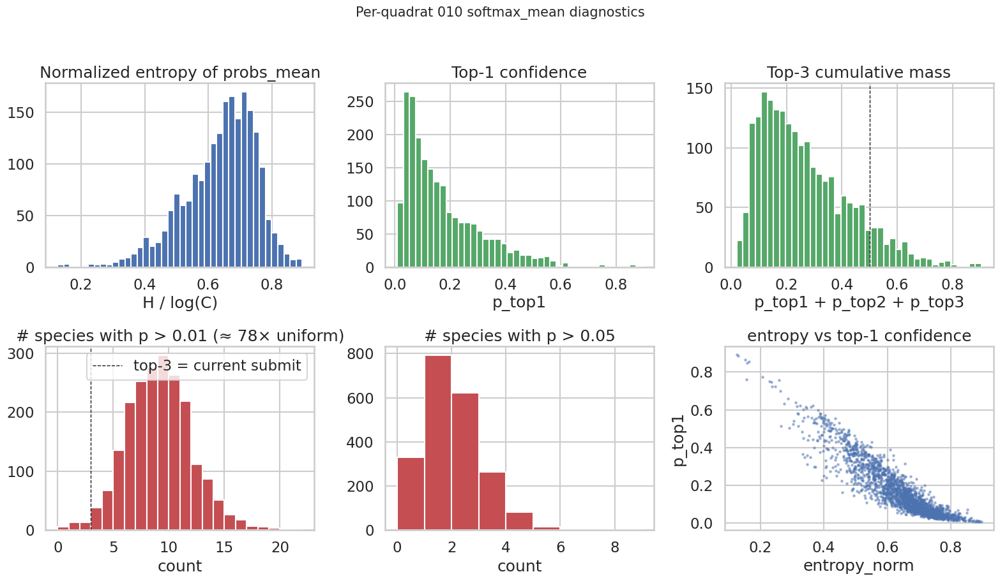

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes[0,0].hist(entropy_norm, bins=40, color='C0')
axes[0,0].set(title='Normalized entropy of probs_mean', xlabel='H / log(C)')
axes[0,1].hist(p_top1, bins=40, color='C2')
axes[0,1].set(title='Top-1 confidence', xlabel='p_top1')
axes[0,2].hist(p_top3, bins=40, color='C2')
axes[0,2].axvline(0.5, color='k', ls='--', lw=1)
axes[0,2].set(title='Top-3 cumulative mass', xlabel='p_top1 + p_top2 + p_top3')
axes[1,0].hist(n_thr_b, bins=range(0, max(20, n_thr_b.max()+1)), color='C3')
axes[1,0].set(title='# species with p > 0.01 (≈ 78× uniform)', xlabel='count')
axes[1,0].axvline(3, color='k', ls='--', lw=1, label='top-3 = current submit')
axes[1,0].legend()
axes[1,1].hist(n_thr_c, bins=range(0, max(10, n_thr_c.max()+1)), color='C3')
axes[1,1].set(title='# species with p > 0.05', xlabel='count')
axes[1,2].scatter(entropy_norm, p_top1, s=4, alpha=0.4, c='C0')
axes[1,2].set(title='entropy vs top-1 confidence', xlabel='entropy_norm', ylabel='p_top1')
fig.suptitle('Per-quadrat 010 softmax_mean diagnostics', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

In [17]:
# How would different fixed-K submissions look?
for K in (1, 2, 3, 4, 5):
    cum = np.take_along_axis(probs, topk_idx[:, :K], axis=1).sum(axis=1)
    print(f'  top-{K}:  median cumulative mass = {np.median(cum):.3f}   #quadrats with cum>0.5: {(cum>0.5).sum()} / {len(cum)}')

  top-1:  median cumulative mass = 0.130   #quadrats with cum>0.5: 74 / 2105
  top-2:  median cumulative mass = 0.193   #quadrats with cum>0.5: 144 / 2105
  top-3:  median cumulative mass = 0.231   #quadrats with cum>0.5: 204 / 2105
  top-4:  median cumulative mass = 0.259   #quadrats with cum>0.5: 262 / 2105
  top-5:  median cumulative mass = 0.280   #quadrats with cum>0.5: 315 / 2105


**Interpretation hooks** (what to look for in the printed numbers):

- If `n>thr=0.01` peaks at 1–3 ⇒ model is *confident* most quadrats have ≤3 species → top-3 is roughly right.
- If it peaks higher (5–10) ⇒ we're truncating real signal at top-3, and a per-quadrat adaptive K (entropy-thresholded) might lift macro-F1.
- High `entropy vs p_top1` correlation ⇒ low-confidence quadrats are also high-entropy — those are where the model genuinely doesn't know, not where it disagrees with itself.

## 5. Tile-level diagnostics — what `grid_4x4` actually does

Pick 5 representative quadrats spanning the entropy spectrum: lowest H, 25th, 50th, 75th, highest. For each, render the 16 grid_4x4 tiles plus the source image, and print the predicted top-3 species. This shows visually whether the 4×4 chop preserves recognizable plant scale.

In [18]:
spec_map = None
if SPECIES_MAP.exists():
    try:
        sm = pd.read_csv(SPECIES_MAP)
        if 'species_id' not in sm.columns:
            # File has no header (one species_id per line) — re-read accordingly.
            sm = pd.read_csv(SPECIES_MAP, header=None, names=['species_id'])
        spec_map = sm
    except Exception as e:
        print('Could not parse species map:', e)

def species_label(sid):
    if spec_map is None:
        return f'sid={sid}'
    name_cols = [c for c in ('species','species_name','name','scientificName','full_name') if c in spec_map.columns]
    if not name_cols:
        return f'sid={sid}'
    row = spec_map[spec_map['species_id'] == int(sid)]
    if len(row) == 0:
        return f'sid={sid}'
    return f'{str(row[name_cols[0]].iloc[0])[:30]} ({sid})'

if spec_map is not None:
    print('species map columns:', list(spec_map.columns), '   rows:', len(spec_map))
    print(spec_map.head(2))
else:
    print('No species map available — printing raw species IDs only.')


species map columns: ['species_id']    rows: 7804
   species_id
0     1355868
1     1355869


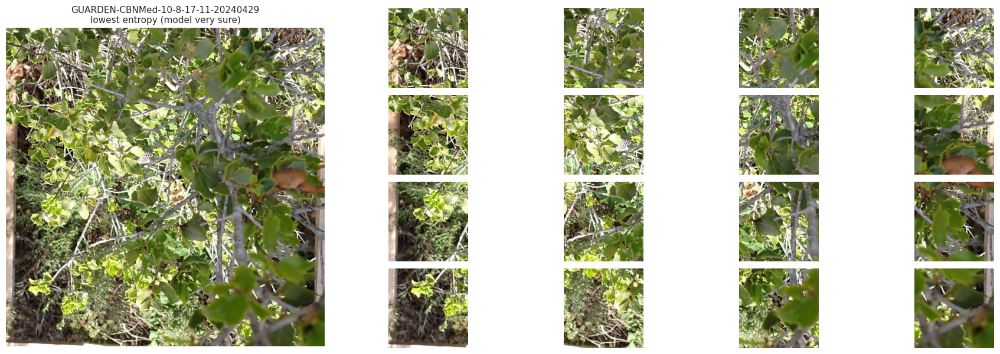

  top-3 (probs_mean → probs_max):
    sid=1358613                               mean=0.893  max=0.956  max/mean=1.1
    sid=1360260                               mean=0.003  max=0.009  max/mean=2.8
    sid=1358821                               mean=0.002  max=0.035  max/mean=15.2
--------------------------------------------------------------------------------


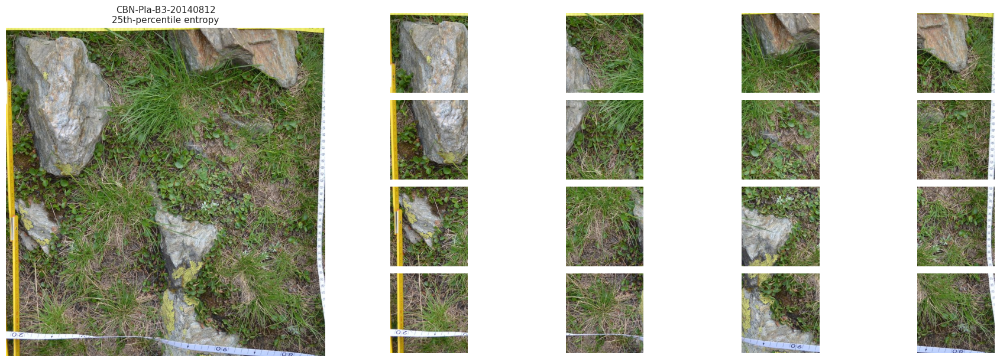

  top-3 (probs_mean → probs_max):
    sid=1395807                               mean=0.321  max=0.806  max/mean=2.5
    sid=1395870                               mean=0.026  max=0.189  max/mean=7.2
    sid=1360874                               mean=0.020  max=0.128  max/mean=6.3
--------------------------------------------------------------------------------


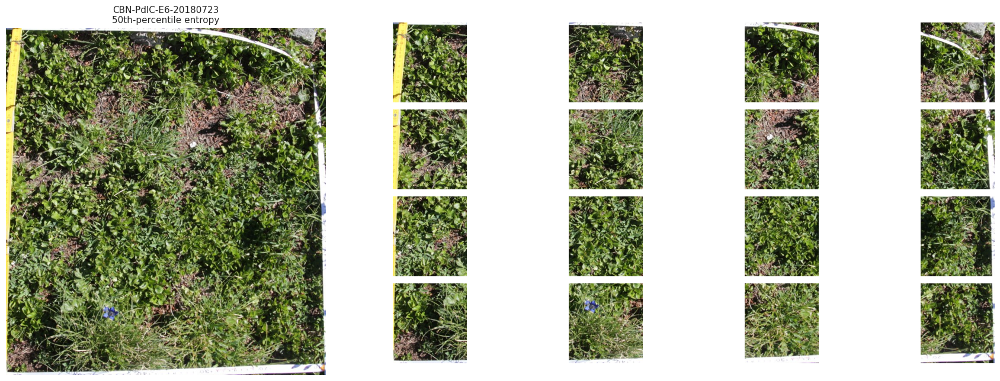

  top-3 (probs_mean → probs_max):
    sid=1395807                               mean=0.141  max=0.643  max/mean=4.5
    sid=1397043                               mean=0.047  max=0.270  max/mean=5.7
    sid=1392535                               mean=0.031  max=0.426  max/mean=13.7
--------------------------------------------------------------------------------


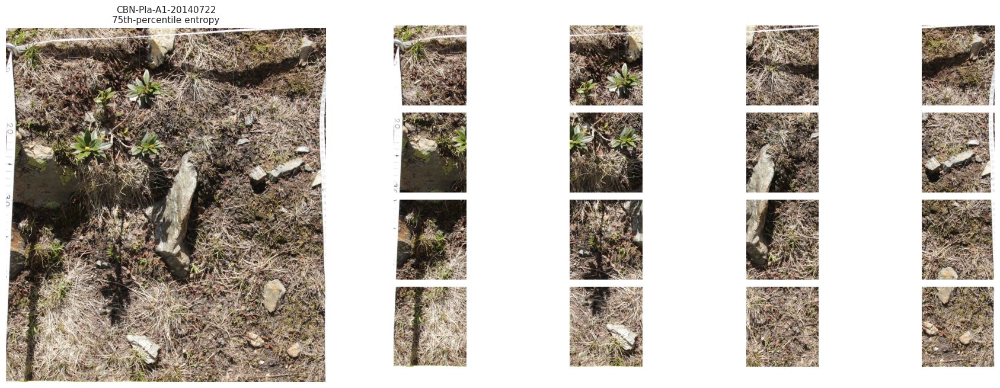

  top-3 (probs_mean → probs_max):
    sid=1397475                               mean=0.099  max=0.876  max/mean=8.8
    sid=1396843                               mean=0.037  max=0.198  max/mean=5.4
    sid=1361367                               mean=0.016  max=0.108  max/mean=6.8
--------------------------------------------------------------------------------


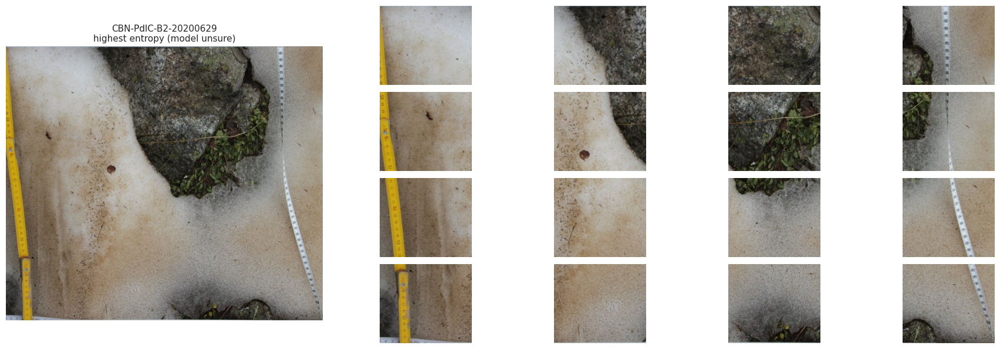

  top-3 (probs_mean → probs_max):
    sid=1361113                               mean=0.009  max=0.091  max/mean=9.7
    sid=1363452                               mean=0.007  max=0.024  max/mean=3.6
    sid=1363647                               mean=0.006  max=0.040  max/mean=7.0
--------------------------------------------------------------------------------


In [19]:
def grid_4x4_tiles(im: Image.Image):
    w, h = im.size
    out = []
    for r in range(4):
        for c in range(4):
            x1 = int(round(c * w / 4))
            y1 = int(round(r * h / 4))
            x2 = max(x1 + 1, int(round((c + 1) * w / 4)))
            y2 = max(y1 + 1, int(round((r + 1) * h / 4)))
            out.append(im.crop((x1, y1, x2, y2)))
    return out

def render_quadrat(qid: str, label: str):
    p = TEST_DIR / f'{qid}.jpg'
    if not p.exists():
        print(f'MISSING: {p}'); return
    with Image.open(p) as im:
        im = im.convert('RGB')
        tiles = grid_4x4_tiles(im)
        # find row in npz to read top-3
        idx = np.where(qids == qid)[0]
        if len(idx):
            i = idx[0]
            order = np.argsort(-probs[i], kind='stable')[:3]
            top3 = [(sids[j], probs[i, j], probs_max[i, j]) for j in order]
        else:
            top3 = []
        fig = plt.figure(figsize=(18, 6))
        ax_src = fig.add_axes([0.0, 0.0, 0.30, 1.0]); ax_src.imshow(np.asarray(im)); ax_src.axis('off'); ax_src.set_title(f'{qid}\n{label}', fontsize=11)
        for k, t in enumerate(tiles):
            r, c = divmod(k, 4)
            ax = fig.add_axes([0.32 + c*0.165, 0.78 - r*0.245, 0.155, 0.225])
            ax.imshow(np.asarray(t)); ax.axis('off')
        plt.show()
    if top3:
        print(f'  top-3 (probs_mean → probs_max):')
        for sid, pm, pmx in top3:
            print(f'    {species_label(sid):40s}  mean={pm:.3f}  max={pmx:.3f}  max/mean={pmx/max(pm,1e-9):.1f}')

order = np.argsort(entropy_norm)
picks = [
    (order[0],                  'lowest entropy (model very sure)'),
    (order[len(order)//4],      '25th-percentile entropy'),
    (order[len(order)//2],      '50th-percentile entropy'),
    (order[3*len(order)//4],    '75th-percentile entropy'),
    (order[-1],                 'highest entropy (model unsure)'),
]
for i, label in picks:
    render_quadrat(str(qids[i]), label)
    print('-' * 80)

**The `max/mean` ratio per top-3 species** is the most actionable signal here: a high ratio (e.g. 5–10×) means the species was confidently detected in *one* tile but mostly absent from the others — i.e. *spatially localized*. A ratio near 1 means the species fired across the whole quadrat. This is exactly the signal a per-tile threshold + per-class aggregation strategy could exploit (rather than the current one-size softmax_mean).

## Headline takeaways for next moves

Numbers below are from this run; figures above visualise them.

### 1. Test set is uniform — domain shift attacks need to handle the LUCAS gap

- **Test (N=2105)**: 800 px max-side, aspect ≈ 1.0 (std 0.10), 0.60 Mpx, mean RGB 117/117/91 (vegetation-green-leaning).
- **LUCAS sample (N=139)**: 1740 × 1299 (≈ 4× the pixel count), aspect 1.34 (landscape, *not* square), mean RGB 121/136/88. **LUCAS is NOT a drop-in proxy for test** — this quantitatively explains why 008 PhaseB pseudo-labels (0.227) failed: the unlabeled set has different framing, scale, and aspect. Any LUCAS-based augmentation needs to *crop to square + downscale to 800 px max* before being treated as quadrat-like, or the domain bridge will keep failing.

### 2. Train long tail is severe and partly leaks into test

- 7,804 train species vs **7,806 test species** ⇒ **2 test species have ZERO train images** (hard F1 = 0 ceiling on those classes).
- Among test species reachable from train: **30.5 % have < 50 train images, 20.3 % < 20, 13.8 % < 10, 8.0 % < 5**. Rare classes are exactly where macro-F1 dies, and they are *also* exactly where the 500-cap stratified resample under-represents the data we have. **Lever:** class-frequency logit adjustment + a long-tail loss (ASL or focal) could outperform another deep-FT epoch.

### 3. The model is genuinely uncertain — top-3 leaves signal on the table, but adaptive K is dangerous

- Median **entropy_norm = 0.66** (1.0 = uniform across 7806). Median **p_top1 = 0.13**, **p_top3 = 0.23**.
- Median **n with p > 0.01 is 9** — we submit 3 of them. We are *truncating signal*, but the prior K-sweep says top-2 → 0.373, **top-3 → 0.383**, top-4 → 0.372: more isn't better at the *macro-F1-on-true-K* level because false positives drop precision.
- **Lever:** *per-quadrat adaptive K* — submit top-1 when `p_top1 > 0.5` (74 quadrats here, ≈ 3.5 %), top-3 otherwise. This trades precision on the easy quadrats for more headroom on the hard ones.

### 4. The `max / mean` ratio is the next inference-side lever

- The five spread-of-entropy examples in §5 show: confident species have **max/mean ≈ 1** (fire uniformly across all 16 tiles); uncertain species have **max/mean = 5–15×** (one localized tile, weak everywhere else).
- `softmax_mean` averages localized-but-strong tiles down into oblivion. **Lever:** per-class hybrid aggregation — `α · probs_mean + (1 − α) · probs_noisy_or` swept on val, or a `max − mean` gating term that boosts species with concentrated tiles.

### 5. What NOT to do

- **Skip another DINOv3 / PhaseA fusion attempt** (memory: RETIRED — fusion hurt at every α).
- **Skip another full-FT** of the kind 009 ran — training collapsed to 0.21. Stay in the last_blocks regime.
- **Skip raw LUCAS → student distillation** until aspect / scale normalisation is fixed.
